# Network Analysis of Community & Climate Action Groups 
## Overview
This notebook shall provide a Social Network Analysis (SNA) on companies that participate in community and climate action groups organised by a particular charitable foundation (the name of the foundation is obfuscated so I can remain anonymous for the purposes of this submission). The notebook demonstrates the implementation of network analysis and Breadth-First Search (BFS) tree generation and visualization of using NetworkX. The analysis includes graph traversal, tree structure examination, and hierarchical visualisation.

## The Business Problem
Not all the companies in the data set participate in all the community and climate action groups: participation varies, which means some companies are  connected to each other via an action group, whilst others are not. The problem this project seeks to address is how the network of companies which participate in these action groups can be visualised and to explore key characteristics of this network.

## Data Understanding
#### Data Characteristics
- The charitable foundation is based in the United Kingdom.
- The companies who participate in its community and climate action groups, are considered the actors in this analyses.
- All the participating companies operate in the UK and the activities of the community and climate action groups are also focussed on UK-related issues.
#### Data Integration 
To prepare the data correctly for the SNA, an Extract, Transform and Load (ETL) process should be used:
- Extract: the data table uploaded into a DataFrame.
- Transform: conversion of the data to an edge list.
- Load: edge list loaded into the notebook for analysis.

## Exploratory Analysis
- Edge list checked to see if successfully loaded by looking at first rows.
- If data looks appropriate for the SNA, move to model design and deployment.

## Model Design
This SNA involves the creation of an undirected network graph of the data and accompanying network analyses:
- Basic characteristics of the network: diameter, radius, eccentricity, periphery and centre.
- Measures of centrality: including degree, closeness, betweenness and Eigenvector centrality. 
- Local clustering coefficient: to measure the amount the individual nodes on the graph tend to cluster together. 
- Degree Distribution, Average Clustering and Transitivity: the overall tendency of the entire network to form clusters. 
- Shortest Path Lengths and Network Density.
- BFS tree: to create a directed tree structure whilst preserving the original hiearchical relationships.

## Model Development
The SNA shall be built as described above and with the following outputs:
- Measures and lists relating to the analyses above.
- Tree statistics (node count, edge count).
- Level-by-level node distribution.
- Visual representations of the network analyses and BFS Tree.

## Deployment
### Visualisation Features
The visualisation includes:
- Node levels clearly displayed
- Hierarchical structure representation
- Color-coded nodes for the local clustering coefficient analysis for better visibility
- Directed edges showing parent-child relationships for the BFS Tree.

### Usage Notes
To use this notebook effectively:
1. Ensure your input graph `G` is properly initialized.
2. Where relevant, you can specify a custom root node or let the algorithm choose the first node.
3. The visualisation automatically adjusts to the size of your graph.
  
### Dependencies
- **NetworkX**: For graph operations and BFS implementation
- **Matplotlib**: For visualization
- **Python 3.10.0**: Core programming language

### Github
Code, documentation and version control can be accessed with permission at https://github.com/ahanchian/CF_SNA.git

In [147]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Load the CSV file into a DataFrame

### Data Source
- Description: open-source data on companies that participate in community and climate action groups that are organised by a particular charitable foundation. 
- Example purposes of the data: to understand the relationship of these companies with community and climate groups and how these companies are connected with one another.
- Authorship: data collected by the charitable foundation. 
- Access details: available in list form on the website of the foundation and as a csv. file from the foundation's IT department.

In [105]:
df = pd.read_csv('CF_Companies_Networks_2024.csv')

In [107]:
df.head()

,Company,Blackpool Leadership Board,Bradford Leadership Board,Coventry Leadership Board,East of England Leadership Board,Newport Leadership Board,North East Leadership Board,North West Leadership Board,South East Leadership Board,South West Leadership Board,...,E&S Leadership Team,E&S Leadership Team.1,Race Leadership Team.1,Global Goals Leadership Team,Wellbeing Leadership Team,Responsible Business Leadership Team,Welsh Leadership Team,Leadership Council,Place,SIB 23/24
0,Accenture,No,No,No,No,No,Yes,No,Yes,No,...,No,No,No,No,No,No,No,No,No,No
1,ACT Training,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,Yes,No
2,ADI Group,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
3,Aegon UK,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
4,AF Blakemore & Son Ltd,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No


# Convert the data to an edge list

Data on the group participation of companies are collected separately by organisers of each of the groups and then combined into one dataset. One challenge is the data may not have a consistent layout with column naming and different leading and trailing whitespaces. `.str.strip()` cleans up these inconsistencies.  

In [111]:
# Step 1: Standardize Column Names (Remove Spaces & Trim)
df.columns = df.columns.str.strip()

As a basic check that the data has been extracted and loaded correctly, `.tolist()` is used, and the names of companies and groups are listed.

In [114]:
# Step 2: Check Company and individual Groups exist in Columns
print(df.columns.tolist())  

['Company', 'Blackpool Leadership Board', 'Bradford Leadership Board', 'Coventry Leadership Board', 'East of England Leadership Board', 'Newport Leadership Board', 'North East Leadership Board', 'North West Leadership Board', 'South East Leadership Board', 'South West Leadership Board', 'London Leadership Board', 'Scotland Leadership Board', 'Wales Leadership Board', 'West Midlands Leadership Board', 'Yorkshire & Humber Leadership Board', 'Sheffield Leadership Board', 'Rochdale Leadership Board', 'Norwich Leadership Board', 'Climate Action Leadership Team', 'Race Leadership Team', 'E&S Leadership Team', 'E&S Leadership Team.1', 'Race Leadership Team.1', 'Global Goals Leadership Team', 'Wellbeing Leadership Team', 'Responsible Business Leadership Team', 'Welsh Leadership Team', 'Leadership Council', 'Place', 'SIB 23/24']


The next steps is to convert the entries in the table to binary format and to use `df.melt` to transform it into an edge list, which greatly facilitates network analysis.

In [117]:
# Step 3: Convert "Yes"/"No" to 1/0
df.replace({"Yes": 1, "No": 0}, inplace=True)

In [119]:
# Step 4: Transform Data into Edge List Format
edge_list = df.melt(id_vars=["Company"], var_name="Group", value_name="Membership")

The final stage of the data transformation is the removal of null values and renaming the columns as "Company" and "Group" for clarity.

In [122]:
# Step 5: Keep Only Valid Connections (Membership == 1)
edge_list = edge_list[edge_list["Membership"] == 1].drop(columns=["Membership"])

In [124]:
# Step 6: Rename Columns for Clarity
edge_list.columns = ["Company", "Group"]

# Edge list saved and checked

The edge list is saved and a simple check made that the ETL is successful using `print_edge_list(head)`. If the data reflects the names of companies and groups that are involved in the Foundation, then it is deemed appropriate for the SNA, and we move to model design and deployment.

In [128]:
# Step 1: Save Edge List
edge_list.to_csv("CF_Companies_Edge_List.csv", index=False)

In [130]:
# Step 2: Check the ETL is successful by looking at first rows
print(edge_list.head())

                         Company                       Group
22    Beaverbrooks the Jewellers  Blackpool Leadership Board
25   Blackpool Football Club Ltd  Blackpool Leadership Board
40                         Cisco  Blackpool Leadership Board
92          Lloyds Banking Group  Blackpool Leadership Board
102            Muse Developments  Blackpool Leadership Board


# Create a network graph and visualisation

### Creation of network graph

In [133]:
# Create a Graph from the Edge List
def create_graph_from_edge_list(edge_list: pd.DataFrame) -> nx.Graph:
    """
    Creates a graph from a given Edge List DataFrame.
    
    This function uses NetworkX `from_pandas_edgelist` to create an undirected graph
    from the Edge List, where the source column is "Company" and the target column is "Group".
    
    Args:
        edge_list (pd.DataFrame): A pandas DataFrame containing the edge list with columns "Company" and "Group".
        
    Returns:
        nx.Graph: An undirected graph created from the edge list.

    Example usage:
        G = Network Analysis of Community & Climate Action Groups 
    
    """
    G = nx.from_pandas_edgelist(edge_list, source="Company", target="Group", create_using=nx.Graph())
    return G

G = create_graph_from_edge_list(edge_list)


### Data Dimensions and Characteristics
- Description: the SNA constitutes a network with multiple edges and nodes. Information on numbers of nodes and edges provided below.
- Independent Variables in the SNA: these are the companies that participate and the community and climate groups they participate in. These are critical to the explanatory power of our analysis, as "when network variables are used as independent variables, the researcher is implicitly or explicitly using 
network theory to explain the consequences of network propertie" (Borgatti et al, 2018, p. 8). 
- Dependent Variables in the SNA: level of participation of companies (how many groups they participate in) and network centrality, i.e. measures of a company's position within the network (e.g., degree centrality, betweenness centrality).
- Categorical data in the SNA: companies that participate and the community and climate groups they participate in.
- Continuous data in the SNA: network centrality, i.e. measures of a company's position within the network (e.g., degree centrality, betweenness centrality).

In [136]:
# Network Information
print("Network Information:")
print("-----------------")
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")


Network Information:
-----------------
Number of nodes: 194
Number of edges: 461


### Creation of Visualisation

For the visualisation, I have opted for a Spring Layout as it tends to produce intuitive and visually appealing outputs. Spring Layouts can be computationally intensive for very large networks, but they can handle a wide range of network sizes, and this network is not so large that it is computationally challenging.

In [89]:
# Step 2: Define Layout for Better Visualization
pos = nx.spring_layout(G, seed=50) 

The resulting visualisation is an accurate representation of the network but does reflect its complexity. To analyse specific nodes, it is necessary to enlarge the visualisation due to the overall number of nodes.

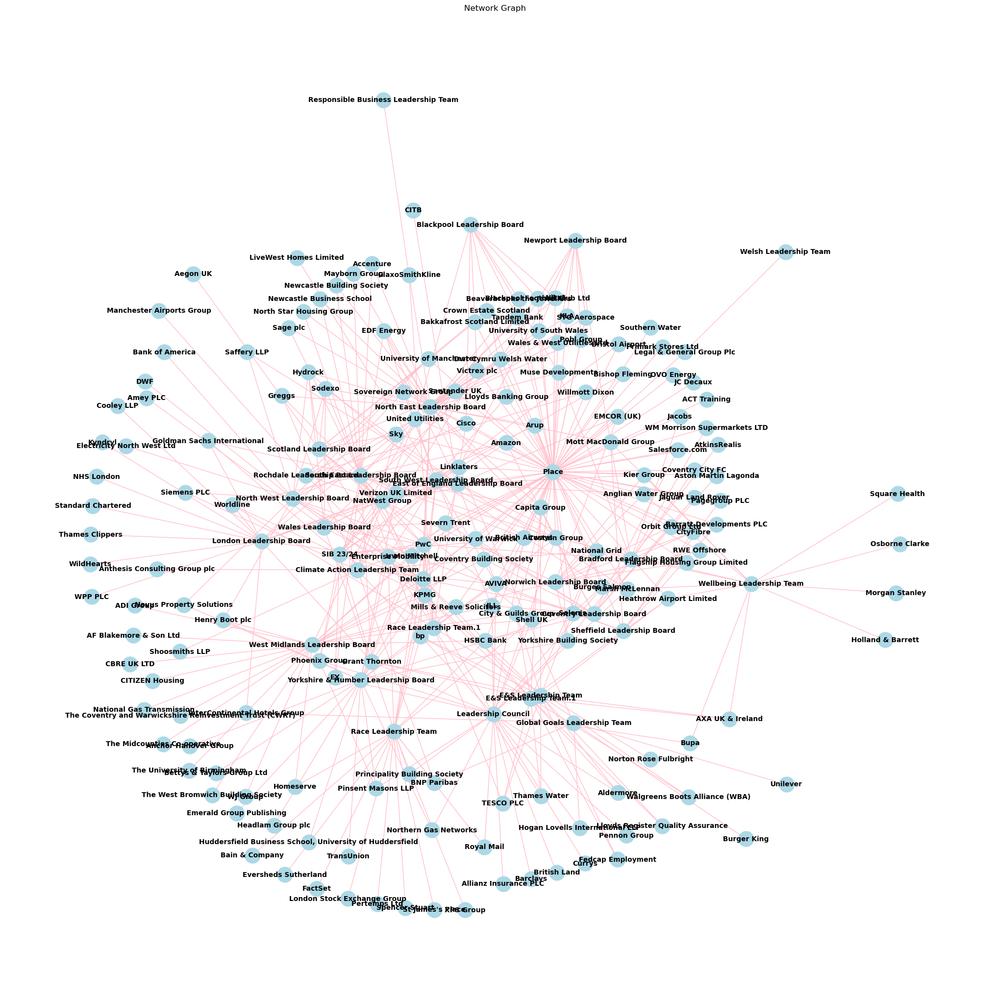

In [91]:
# Step 3: Draw the Network
plt.figure(figsize=(20,20))  

# Set layout
pos = nx.kamada_kawai_layout(G)

# Draw the network with node sizes reflecting degree centrality
nx.draw(G, pos, 
        with_labels=True, 
        node_color="lightblue", 
        edge_color="pink",
        node_size=500, 
        font_size=10, 
        font_weight="bold")

plt.title("Network Graph")
plt.show()

# Identify Characteristics of the Network

Starting with diameter to get an understanding of the overall structure and connectivity of the network, the shortest path between two nodes is 6. This reflects a classic "six degrees of separation" pattern. Newman observes that network diameter is often relatively low in real life examples as a result of this "small world" effect (Newman, 2010, p. 240). 

In [176]:
# 1. Diameter
diameter = nx.diameter(G)
print(f"Network diameter: {diameter}")

Network diameter: 6


Another measure of interest is eccentricity or the length of the longest shortest path from the node to any other node. As this measure is specific to each node, it produces a lot of data. Thinking creatively, I decided to print this in rank order to make it easier to highlight patterns in the data. This is an approach I use throughout the SNA to help with usability and explanability.

In [179]:
# 2. Eccentricity
# Calculate eccentricities
eccentricities = nx.eccentricity(G)

# Sort nodes by eccentricity in descending order
sorted_eccentricities = sorted(eccentricities.items(), key=lambda item: item[1], reverse=True)

# Print nodes and their eccentricities in rank order
for node, ecc in sorted_eccentricities:
    print(f"Node: {node}, Eccentricity: {ecc}")

Node: CITB, Eccentricity: 6
Node: Saffery LLP, Eccentricity: 6
Node: Bank of America, Eccentricity: 6
Node: DWF, Eccentricity: 6
Node: Electricity North West Ltd, Eccentricity: 6
Node: Henry Boot plc, Eccentricity: 6
Node: Novus Property Solutions, Eccentricity: 6
Node: LiveWest Homes Limited, Eccentricity: 6
Node: Cooley LLP, Eccentricity: 6
Node: InterContinental Hotels Group, Eccentricity: 6
Node: Kyndryl, Eccentricity: 6
Node: NHS London, Eccentricity: 6
Node: Standard Chartered, Eccentricity: 6
Node: Thames Clippers, Eccentricity: 6
Node: WildHearts, Eccentricity: 6
Node: WPP PLC, Eccentricity: 6
Node: Aegon UK, Eccentricity: 6
Node: Amey PLC, Eccentricity: 6
Node: ADI Group, Eccentricity: 6
Node: AF Blakemore & Son Ltd, Eccentricity: 6
Node: CBRE UK LTD, Eccentricity: 6
Node: CITIZEN Housing, Eccentricity: 6
Node: Homeserve, Eccentricity: 6
Node: National Gas Transmission, Eccentricity: 6
Node: The Coventry and Warwickshire Reinvestment Trust (CWRT), Eccentricity: 6
Node: The Mid

The radius calculation further reinforces the network profile as being relatively dense, as do the number of nodes on the centre.

In [182]:
# 3. Radius
radius = nx.radius(G)
print(f"Radius: {radius}")

Radius: 4


In [184]:
# 4. Centre
centre = nx.center(G)
print(f"Centre: {centre}")

Centre: ['Beaverbrooks the Jewellers', 'Blackpool Football Club Ltd', 'Cisco', 'Muse Developments', 'Nikal', 'Tandem Bank', 'Victrex plc', 'Mott MacDonald Group', 'PwC', 'Capita Group', 'Deloitte LLP', 'NatWest Group', 'Dwr Cymru Welsh Water', 'KLA', 'Linklaters', 'Pobl Group', 'STG Aerospace', 'University of South Wales', 'Wales & West Utilities Ltd', 'Arup', 'Costain Group', 'Enterprise Mobility', 'South East Leadership Board', 'Shell UK', 'Leadership Council', 'Place']


By contrast, there are also a large number of the nodes in the periphery, which is a first indication that the network is a tree structure - this is further investigated in the "Local clustering coefficient analysis" section below.

In [187]:
# 5. Periphery
periphery = nx.periphery(G)
print(f"Periphery: {periphery}")

Periphery: ['CITB', 'Saffery LLP', 'Bank of America', 'DWF', 'Electricity North West Ltd', 'Henry Boot plc', 'Novus Property Solutions', 'LiveWest Homes Limited', 'Cooley LLP', 'InterContinental Hotels Group', 'Kyndryl', 'NHS London', 'Standard Chartered', 'Thames Clippers', 'WildHearts', 'WPP\xa0PLC', 'Aegon UK', 'Amey PLC', 'ADI Group', 'AF Blakemore & Son Ltd', 'CBRE UK LTD', 'CITIZEN Housing', 'Homeserve', 'National Gas Transmission', 'The Coventry and Warwickshire Reinvestment Trust (CWRT)', 'The Midcounties Co-operative', 'The University of Birmingham', 'The West Bromwich Building Society', 'WJ Group', 'Anchor Hanover Group', 'Bettys & Taylors Group Ltd', 'Emerald Group Publishing', 'Headlam Group plc', 'Huddersfield Business School, University of Huddersfield', 'TransUnion', 'Manchester Airports Group', 'Anthesis Consulting Group plc', 'Shoosmiths LLP', 'Bain & Company', 'Eversheds Sutherland', 'FactSet', 'London Stock Exchange Group', 'Pertemps Ltd', 'Spencer Stuart', "St James

# Calculate Measures of Centrality



## Degree Centrality

Degree centrality is very useful in this SNA as it helps us understand the most influential nodes. When ranked, the group with greatest connectivity is Place, which is group that manages urban regeneration in city and town centres. This is followed by the regional boards, which suggests that groups that are involved in geographically specific activities are most connected. This is an interesting insight in itself, but shall be unpacked further in subsequent analyses after the end if this course.  

In [100]:
# The degree centrality calculation should generate a list of floats to 3 decimal places
from typing import List

def process_data(data: List[int]) -> List[float]:
    return [float(f"{(x / 10.0):.3f}") for x in data] 

# Example usage
# G = Network Analysis of Community & Climate Action Groups 

# Calculate degree centralities
degreec = nx.degree_centrality(G)

# Sort nodes by degree centralities in descending order
sorted_degreec = sorted(degreec.items(), key=lambda item: item[1], reverse=True)

# Print nodes and their degree centralities in rank order
for node, ecc in sorted_degreec:
    print(f"Node: {node}, Degreec: {ecc:.3f}")

Node: Place, Degreec: 0.389
Node: North East Leadership Board, Degreec: 0.166
Node: South East Leadership Board, Degreec: 0.140
Node: Leadership Council, Degreec: 0.130
Node: West Midlands Leadership Board, Degreec: 0.124
Node: Yorkshire & Humber Leadership Board, Degreec: 0.104
Node: North West Leadership Board, Degreec: 0.093
Node: Race Leadership Team, Degreec: 0.093
Node: London Leadership Board, Degreec: 0.088
Node: South West Leadership Board, Degreec: 0.078
Node: E&S Leadership Team, Degreec: 0.078
Node: E&S Leadership Team.1, Degreec: 0.078
Node: SIB 23/24, Degreec: 0.078
Node: Coventry Leadership Board, Degreec: 0.073
Node: Deloitte LLP, Degreec: 0.073
Node: KPMG, Degreec: 0.067
Node: Norwich Leadership Board, Degreec: 0.067
Node: Climate Action Leadership Team, Degreec: 0.067
Node: Wellbeing Leadership Team, Degreec: 0.067
Node: PwC, Degreec: 0.062
Node: East of England Leadership Board, Degreec: 0.062
Node: NatWest Group, Degreec: 0.062
Node: Race Leadership Team.1, Degreec:

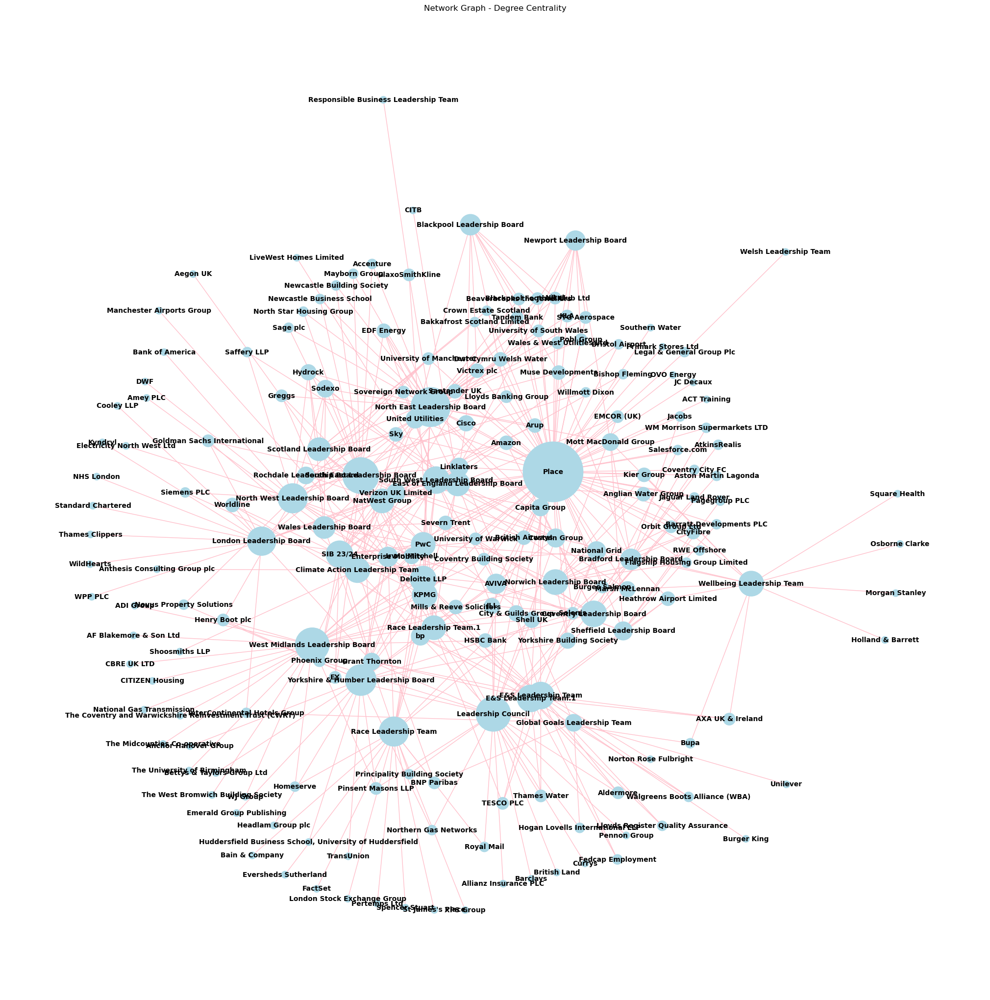

In [101]:
# Degree Centrality Map
plt.figure(figsize=(20,20))  

# Calculate node sizes based on degree centrality
size = [x*20000 for x in list(nx.degree_centrality(G).values())]

# Set layout
pos = nx.kamada_kawai_layout(G)

# Draw the network with node sizes reflecting degree centrality
nx.draw(G, pos, 
        with_labels=True, 
        node_color="lightblue", 
        edge_color="pink",
        node_size=size, 
        font_size=10, 
        font_weight="bold")

plt.title("Network Graph - Degree Centrality")
plt.show()


## Closeness Centrality

As nodes with high closeness centrality are typically quite effective communication hubs or key influencers in a network, it is interesting that the top 3 actors for closeness centrality are all consultancy firms. Unsurprisingly, the Place group also has high closeness centrality, given its high overall connectivity.

In [110]:
# The closeness centrality calculation should generate a list of floats to 3 decimal places
from typing import List

def process_data(data: List[int]) -> List[float]:
    return [float(f"{(x / 10.0):.3f}") for x in data] 

# Example usage
# G = Network Analysis of Community & Climate Action Groups 

# Calculate closeness centralities
closenessc = nx.closeness_centrality(G)

# Sort nodes by closeness centralities in descending order
sorted_closenessc = sorted(closenessc.items(), key=lambda item: item[1], reverse=True)

# Print nodes and their closeness centralities in rank order
for node, ecc in sorted_closenessc:
    print(f"Node: {node}, Closenessc: {ecc:.3f}")
    

Node: Place, Closenessc: 0.479
Node: KPMG, Closenessc: 0.448
Node: Deloitte LLP, Closenessc: 0.440
Node: PwC, Closenessc: 0.412
Node: NatWest Group, Closenessc: 0.412
Node: Enterprise Mobility, Closenessc: 0.398
Node: North East Leadership Board, Closenessc: 0.390
Node: South East Leadership Board, Closenessc: 0.384
Node: Costain Group, Closenessc: 0.382
Node: Verizon UK Limited, Closenessc: 0.379
Node: Leadership Council, Closenessc: 0.379
Node: AVIVA, Closenessc: 0.378
Node: Shell UK, Closenessc: 0.373
Node: Linklaters, Closenessc: 0.369
Node: JLL, Closenessc: 0.368
Node: United Utilities, Closenessc: 0.365
Node: Irwin Mitchell, Closenessc: 0.363
Node: Capita Group, Closenessc: 0.361
Node: British Airways, Closenessc: 0.361
Node: West Midlands Leadership Board, Closenessc: 0.361
Node: Yorkshire & Humber Leadership Board, Closenessc: 0.361
Node: Marsh McLennan, Closenessc: 0.359
Node: National Grid, Closenessc: 0.359
Node: North West Leadership Board, Closenessc: 0.359
Node: South Wes

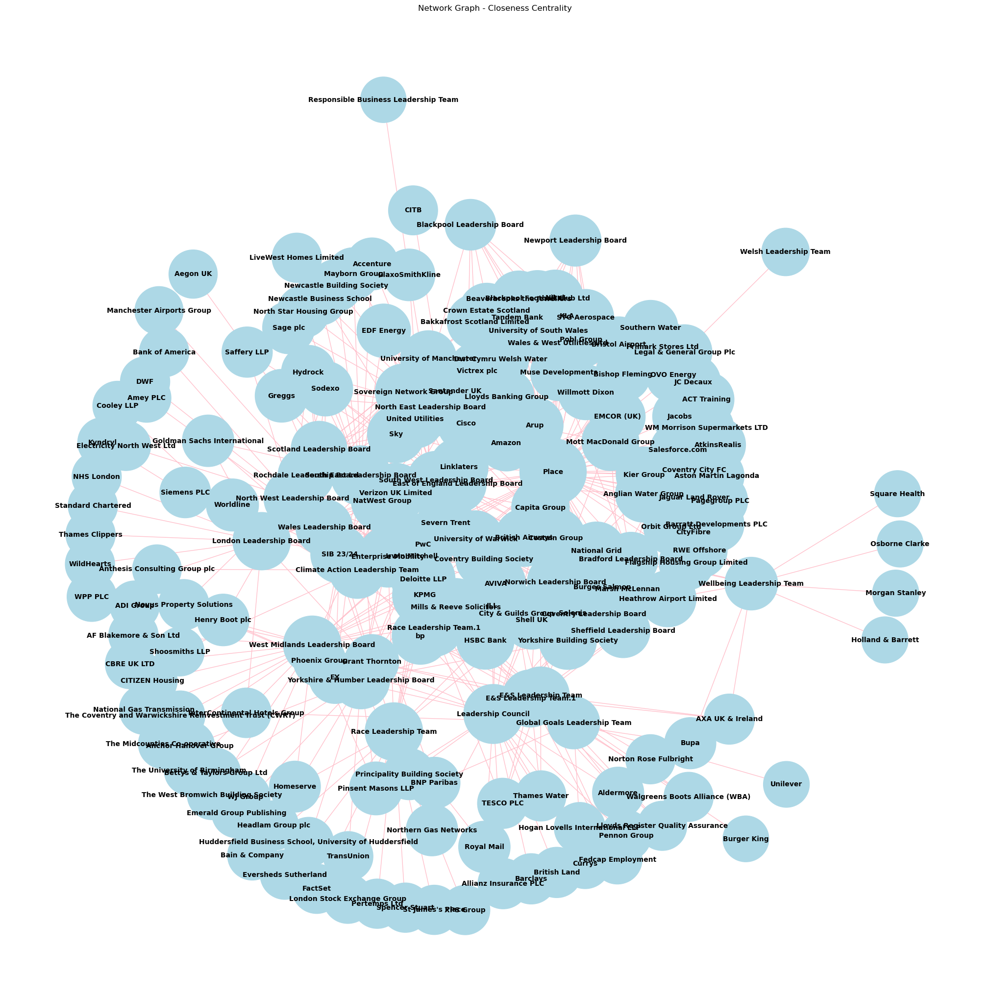

In [111]:
# Closeness Centrality Map
plt.figure(figsize=(20,20))  

# Calculate node sizes based on closeness centrality
size = [x*20000 for x in list(nx.closeness_centrality(G).values())]

# Set layout
pos = nx.kamada_kawai_layout(G)

# Draw the network with node sizes reflecting closeness centrality
nx.draw(G, pos, 
        with_labels=True, 
        node_color="lightblue", 
        edge_color="pink",
        node_size=size, 
        font_size=10, 
        font_weight="bold")

plt.title("Network Graph - Closeness Centrality")
plt.show()

## Betweenness Centrality

As betweenness centrality helps quantify the importance of a node as a bridge in terms of shortest paths between other nodes, it can be powerful at identifying actors that are potential brokers or go-betweens. In this data set, the Leadership boards and councils appear to critical intermediaries, suggesting senior leaders are particularly important. Again, the Place group also scores highly given its overall very high connectivity. 

In [113]:
# The betweenness centrality calculation should generate a list of floats to 3 decimal places
from typing import List

def process_data(data: List[int]) -> List[float]:
    return [float(f"{(x / 10.0):.3f}") for x in data] 

# Example usage
# G = Network Analysis of Community & Climate Action Groups 

# Calculate betweenness centralities
betweennessc = nx.betweenness_centrality(G,weight=None, normalized=False)

# Sort nodes by betweenness centralities in descending order
sorted_betweennessc = sorted(betweennessc.items(), key=lambda item: item[1], reverse=True)

# Print nodes and their betweenness centralities in rank order
for node, ecc in sorted_betweennessc:
    print(f"Node: {node}, Betweennessc: {ecc:.3f}")
    

Node: Place, Betweennessc: 8143.968
Node: West Midlands Leadership Board, Betweennessc: 2206.815
Node: Leadership Council, Betweennessc: 1991.130
Node: Race Leadership Team, Betweennessc: 1830.893
Node: London Leadership Board, Betweennessc: 1602.895
Node: Yorkshire & Humber Leadership Board, Betweennessc: 1553.851
Node: North East Leadership Board, Betweennessc: 1521.462
Node: KPMG, Betweennessc: 1463.584
Node: Deloitte LLP, Betweennessc: 1442.166
Node: South East Leadership Board, Betweennessc: 1353.208
Node: North West Leadership Board, Betweennessc: 1107.232
Node: NatWest Group, Betweennessc: 1058.063
Node: PwC, Betweennessc: 930.480
Node: Wellbeing Leadership Team, Betweennessc: 885.448
Node: Enterprise Mobility, Betweennessc: 697.603
Node: Linklaters, Betweennessc: 693.765
Node: Climate Action Leadership Team, Betweennessc: 671.610
Node: E&S Leadership Team, Betweennessc: 616.921
Node: E&S Leadership Team.1, Betweennessc: 616.921
Node: Race Leadership Team.1, Betweennessc: 578.04

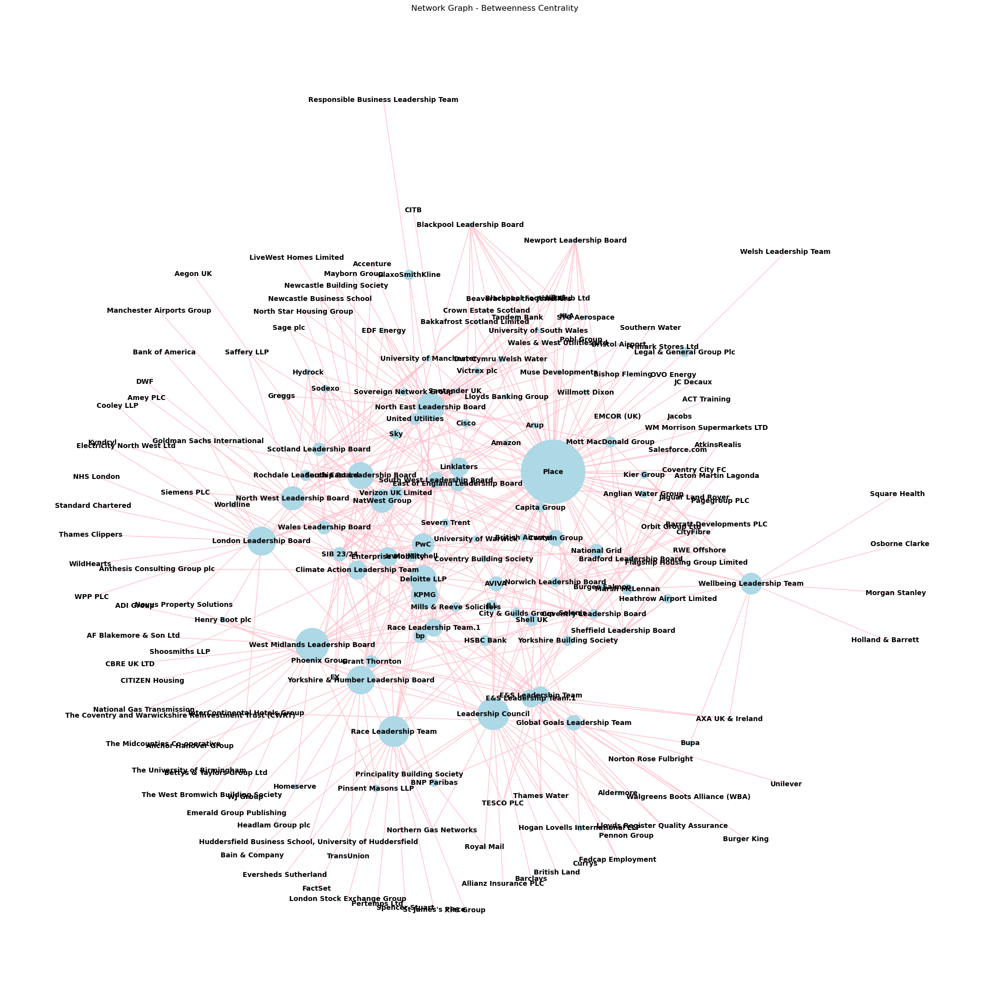

In [114]:
# Betweenness Centrality Map
plt.figure(figsize=(20,20))  

# Calculate node sizes based on betweeneness centrality
size = [x*20000 for x in list(nx.betweenness_centrality(G).values())]

# Set layout
pos = nx.kamada_kawai_layout(G)

# Draw the network with node sizes reflecting closeness centrality
nx.draw(G, pos, 
        with_labels=True, 
        node_color="lightblue", 
        edge_color="pink",
        node_size=size, 
        font_size=10, 
        font_weight="bold")

plt.title("Network Graph - Betweenness Centrality")
plt.show()

## Eigenvector Centrality

As Eigenvector centrality scores nodes based on connections to high-scoring nodes contributing more to the score than low-scoring nodes, it can identify network hot spots. As Aksakalli points out, Eigenvector centrality "defines the centrality of a node as proportional to its neighbours’ importance" (Aksakalli, 2017). In this SNA, it has identified the Place group not only as well-connected but also connected to influential neighbours, making it highly influential within the network.

In [116]:
# The eingenvector centrality calculation should generate a list of floats to 3 decimal places
from typing import List

def process_data(data: List[int]) -> List[float]:
    return [float(f"{(x / 10.0):.3f}") for x in data] 

# Example usage
# G = Network Analysis of Community & Climate Action Groups 
   
# Calculate eigenvector centralities
eigenvectorc = nx.eigenvector_centrality(G)

# Sort nodes by eigenvector centralities in descending order
sorted_eigenvectorc = sorted(eigenvectorc.items(), key=lambda item: item[1], reverse=True)

# Print nodes and their eigenvector centralities in rank order
for node, ecc in sorted_eigenvectorc:
    print(f"Node: {node}, Eigenvectorc: {ecc:.3f}")

Node: Place, Eigenvectorc: 0.494
Node: North East Leadership Board, Eigenvectorc: 0.206
Node: South East Leadership Board, Eigenvectorc: 0.189
Node: Deloitte LLP, Eigenvectorc: 0.181
Node: KPMG, Eigenvectorc: 0.161
Node: PwC, Eigenvectorc: 0.154
Node: NatWest Group, Eigenvectorc: 0.147
Node: SIB 23/24, Eigenvectorc: 0.128
Node: South West Leadership Board, Eigenvectorc: 0.123
Node: North West Leadership Board, Eigenvectorc: 0.119
Node: Yorkshire & Humber Leadership Board, Eigenvectorc: 0.115
Node: Costain Group, Eigenvectorc: 0.115
Node: West Midlands Leadership Board, Eigenvectorc: 0.114
Node: Leadership Council, Eigenvectorc: 0.113
Node: Verizon UK Limited, Eigenvectorc: 0.108
Node: Enterprise Mobility, Eigenvectorc: 0.106
Node: Capita Group, Eigenvectorc: 0.105
Node: Linklaters, Eigenvectorc: 0.104
Node: AVIVA, Eigenvectorc: 0.102
Node: United Utilities, Eigenvectorc: 0.100
Node: Coventry Leadership Board, Eigenvectorc: 0.097
Node: Race Leadership Team.1, Eigenvectorc: 0.090
Node: N

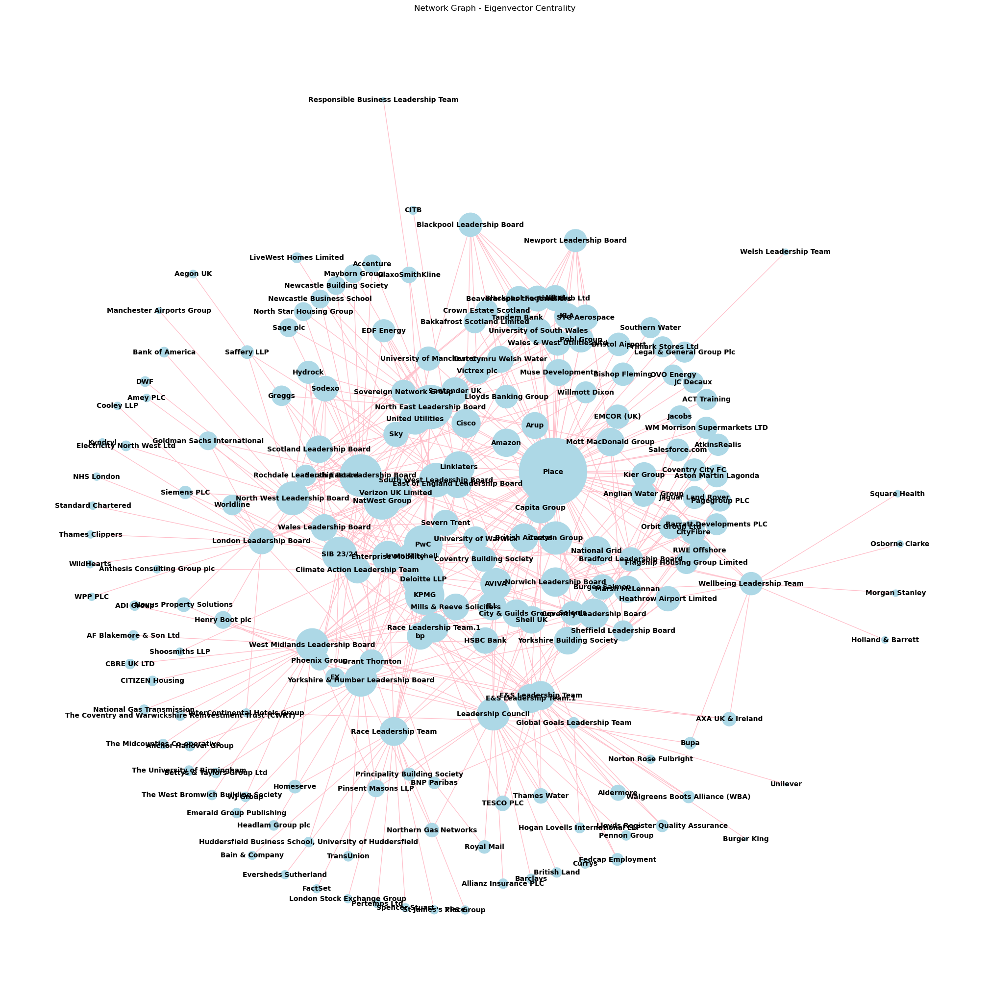

In [117]:
# Eigenvector Centrality Map
plt.figure(figsize=(20,20))  

# Calculate node sizes based on eigenvector centrality
size = [x*20000 for x in list(nx.eigenvector_centrality(G).values())]

# Set layout
pos = nx.kamada_kawai_layout(G)

# Draw the network with node sizes reflecting eigenvector centrality
nx.draw(G, pos, 
        with_labels=True, 
        node_color="lightblue", 
        edge_color="pink",
        node_size=size, 
        font_size=10, 
        font_weight="bold")

plt.title("Network Graph - Eigenvector Centrality")
plt.show()

# Local clustering coefficient analysis

Local clustering coefficient analysis often identifies local cliques or sub graphs, but this is not the case in this SNA. The visualisation below is colour coded, with the darker the colour of the node indicating a lower coefficient. In this SNA, all nodes are the darkest colour, indicating a coefficient of 0. In other words, there are no triangles formed between any node and its neighbors. This indicates that the node's neighbors are no local cliques or sub graphs and in fact the network is a tree structure.

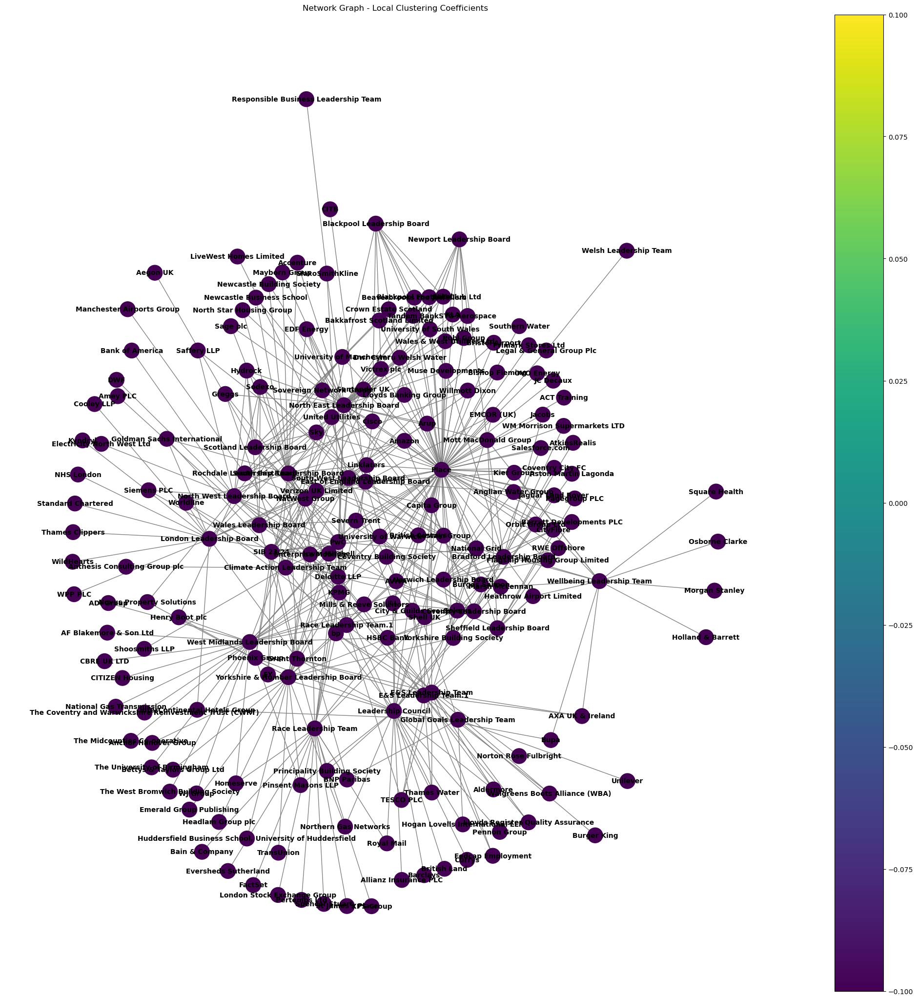

In [121]:
# Calculate local clustering coefficients
clustering_coef = nx.clustering(G)

# Visualize the network with clustering coefficients
plt.figure(figsize=(20,20))

# Set layout
pos = nx.kamada_kawai_layout(G)

# Create normalization for the colorbar
norm = Normalize(vmin=min(clustering_coef.values()), vmax=max(clustering_coef.values()))

# Draw the network
nx.draw(G, pos,
        with_labels=True,
        node_color=list(clustering_coef.values()),
        node_size=500,
        cmap=plt.cm.viridis,  
        edge_color='gray',
        font_size=10,
        font_weight='bold')

plt.title("Network Graph - Local Clustering Coefficients")

# Create colorbar with proper normalization
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=norm)
sm.set_array([])  
plt.colorbar(sm, ax=plt.gca())

plt.show()

# Degree distribution, average clustering and transitivity

## Degree Distribution

As with the centrality measures, degree distribution highlights the importance of the Place group. The criticality of this group to the overall network does raise questions regarding robustness. The resilience of the network could be severely challenged if for some reason this group was disbanded or lost a substantial number of participants. 

In [126]:
# Calculate degrees for all nodes
degrees = dict(nx.degree(G))

# Sort nodes by degree in descending order
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

# Print nodes and their degrees in rank order
for node, deg in sorted_degrees:
    print(f"Node: {node}, degree: {deg}")

# Actual degree distribution (frequency of each degree)
degree_sequence = [d for n, d in G.degree()]
degree_count = {}
for d in degree_sequence:
    if d in degree_count:
        degree_count[d] += 1
    else:
        degree_count[d] = 1

# Print degree distribution
print("\nDegree Distribution:")
for degree, count in sorted(degree_count.items()):
    print(f"Degree {degree}: {count} nodes")

Node: Place, degree: 75
Node: North East Leadership Board, degree: 32
Node: South East Leadership Board, degree: 27
Node: Leadership Council, degree: 25
Node: West Midlands Leadership Board, degree: 24
Node: Yorkshire & Humber Leadership Board, degree: 20
Node: North West Leadership Board, degree: 18
Node: Race Leadership Team, degree: 18
Node: London Leadership Board, degree: 17
Node: South West Leadership Board, degree: 15
Node: E&S Leadership Team, degree: 15
Node: E&S Leadership Team.1, degree: 15
Node: SIB 23/24, degree: 15
Node: Coventry Leadership Board, degree: 14
Node: Deloitte LLP, degree: 14
Node: KPMG, degree: 13
Node: Norwich Leadership Board, degree: 13
Node: Climate Action Leadership Team, degree: 13
Node: Wellbeing Leadership Team, degree: 13
Node: PwC, degree: 12
Node: East of England Leadership Board, degree: 12
Node: NatWest Group, degree: 12
Node: Race Leadership Team.1, degree: 12
Node: Scotland Leadership Board, degree: 11
Node: Wales Leadership Board, degree: 10


## Average clustering and transitivity

Both average clustering and transitivity scores for this SNA are 0, which is a reflection of the tree structure of the network. This does raise questions about the cohesiveness of the network - with no natural connections being detected beyond participation of the groups. In other words, the resilience of the network is highly dependent of the groups themselves. There may be informal connections between the actors - or joint projects not captured in this current data set. This is something I would like to review after the end of this project and potentially look at additional data collection. 

In [128]:
# Calculate and print average clustering
avg_clustering = nx.average_clustering(G)
print(f"\nAverage clustering: {avg_clustering}")


Average clustering: 0.0


In [130]:
# Calculate and print transitivity
transitivity = nx.transitivity(G)
print(f"\nTransitivity: {transitivity}")


Transitivity: 0


# Shortest Path Lengths and Network Density

Shortest path length analysis for this SNA has yielded a relatively efficient transfer across the network. However, it should be noted that this transfer is always with a group being the connecting node, so again there are questions about  network robustness. This is reflected in the relatively low level of network density.

## Shortest Path Lengths

In [133]:
# Average Shortest Path Length
print(f"Average shortest path length: {nx.average_shortest_path_length(G)}")

Average shortest path length: 3.273276000213664


In [134]:
# All Pairs Shortest Path Lengths
try:
    print("\nAll Pairs Shortest Path Lengths:")
    for source, targets in nx.all_pairs_shortest_path_length(G):
        print(f"\nFrom node {source}:")
        for target, length in targets.items():
            print(f"  To node {target}: {length}")
except:
    print("Cannot calculate all pairs shortest paths for disconnected graph")


All Pairs Shortest Path Lengths:

From node Beaverbrooks the Jewellers:
  To node Beaverbrooks the Jewellers: 0
  To node Blackpool Leadership Board: 1
  To node North East Leadership Board: 1
  To node Place: 1
  To node Blackpool Football Club Ltd: 2
  To node Cisco: 2
  To node Lloyds Banking Group: 2
  To node Muse Developments: 2
  To node Nikal: 2
  To node Tandem Bank: 2
  To node United Utilities: 2
  To node Victrex plc: 2
  To node Accenture: 2
  To node Arup: 2
  To node bp: 2
  To node Capita Group: 2
  To node Costain Group: 2
  To node Deloitte LLP: 2
  To node Dwr Cymru Welsh Water: 2
  To node EDF Energy: 2
  To node GlaxoSmithKline: 2
  To node Greggs: 2
  To node Hydrock: 2
  To node KLA: 2
  To node Linklaters: 2
  To node Mayborn Group: 2
  To node Mott MacDonald Group: 2
  To node Newcastle Building Society: 2
  To node Newcastle Business School: 2
  To node North Star Housing Group: 2
  To node Pobl Group: 2
  To node PwC: 2
  To node Sage plc: 2
  To node Sodexo

## Network Density

In [138]:
# Network Density

print(f"Network density: {nx.density(G)}")


Network density: 0.02462475295123124


# Breadth-First Search (BFS) 

Given the tree structure of the network, I thought it would be useful to create a Breadth-First Search (BFS) tree. This analysis involves all nodes at a given depth being processed before moving on to the next level, which helps us understand the overall shape of the tree. In this SNA, it identicates the place group and the leadership council and leadership boards sit at the centre of the tree and that the actors and other groups are in the outer layer.


BFS Tree Information:
Root node: Beaverbrooks the Jewellers
Number of nodes: 194
Number of edges: 193

Nodes by level:
Level 0: ['Beaverbrooks the Jewellers']
Level 1: ['Blackpool Leadership Board', 'North East Leadership Board', 'Place']
Level 2: ['Blackpool Football Club Ltd', 'Cisco', 'Lloyds Banking Group', 'Muse Developments', 'Nikal', 'Tandem Bank', 'United Utilities', 'Victrex plc', 'Accenture', 'Arup', 'bp', 'Capita Group', 'Costain Group', 'Deloitte LLP', 'Dwr Cymru Welsh Water', 'EDF Energy', 'GlaxoSmithKline', 'Greggs', 'Hydrock', 'KLA', 'Linklaters', 'Mayborn Group', 'Mott MacDonald Group', 'Newcastle Building Society', 'Newcastle Business School', 'North Star Housing Group', 'Pobl Group', 'PwC', 'Sage plc', 'Sodexo', 'STG Aerospace', 'University of South Wales', 'Wales & West Utilities Ltd', 'ACT Training', 'Amazon', 'Anglian Water Group', 'Aston Martin Lagonda', 'AtkinsRealis', 'AVIVA', 'Bakkafrost Scotland Limited', 'Barratt Developments PLC', 'Bishop Fleming', 'Bristol

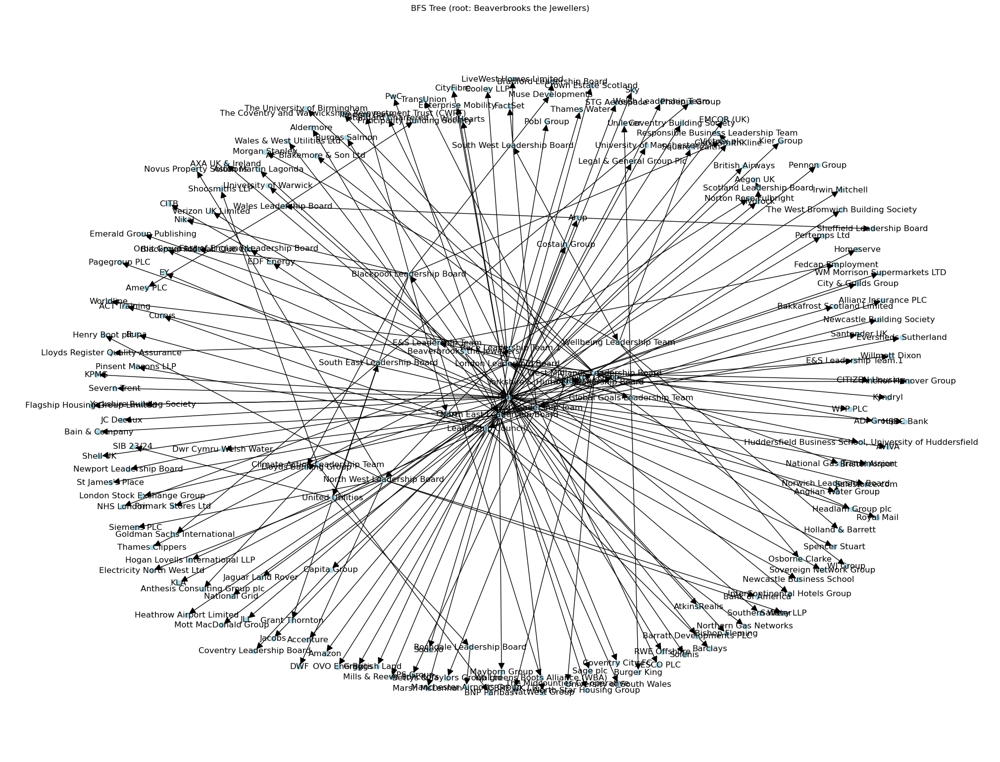

In [140]:
# Create a BFS Tree
def create_and_show_bfs_tree(G, root_node=None):
    try:
        # If no root node is specified, take the first node from the graph
        if root_node is None:
            root_node = list(G.nodes())[0]
            
        # Create BFS tree
        bfs_tree = nx.bfs_tree(G, root_node)
        
        # Get basic information about the tree
        print(f"\nBFS Tree Information:")
        print(f"Root node: {root_node}")
        print(f"Number of nodes: {bfs_tree.number_of_nodes()}")
        print(f"Number of edges: {bfs_tree.number_of_edges()}")
        
        # Get levels of nodes in BFS tree
        levels = {root_node: 0}
        for node in nx.bfs_tree(G, root_node):
            for successor in bfs_tree.successors(node):
                levels[successor] = levels[node] + 1
                
        # Print nodes by level
        max_level = max(levels.values())
        print("\nNodes by level:")
        for level in range(max_level + 1):
            nodes_at_level = [node for node, l in levels.items() if l == level]
            print(f"Level {level}: {nodes_at_level}")
            
        # Visualize the tree
        pos = nx.spring_layout(bfs_tree)
        plt.figure(figsize=(20, 15))
        nx.draw(bfs_tree, pos, with_labels=True, 
                node_color='lightblue', 
                node_size=50, 
                arrowsize=20)
        plt.title(f"BFS Tree (root: {root_node})")
        plt.show()
        
        return bfs_tree
        
    except Exception as e:
        print(f"Error creating BFS tree: {str(e)}")
        return None

# Generate and display the BFS tree
bfs_tree = create_and_show_bfs_tree(G)

# Concluding observations and reflections
Overall, the SNA conducted here has helped me get closer to meeting the objectives of the project. As well as being a valuable analytic exercise in itself, I plan to use it as a starting point for my Capstone project and EPA report. I will continue to iterate both the data set and SNA over time, learning from additional feedback and testing.

In terms of data quality, I have identified a number of limitations that I would like to explore further. Whilst the data set is complete, there are currently limited additional data points to help build a profile of the network, such as levels of attendance or business profile. As I iterate the SNA, I will seek to add to the richness of the data through additional data collection activities.

One key learning about the network is its tree structure, with the lack of closed loops. This is a consequence of the type of data being used. i.e. participation of groups by companies, essentially as Boolean relationship. In future iterations I would like to understand how companies connect with each other, perhaps in terms of their joint participation of specific projects in the groups - again additional data collection shall be required for this.

In terms of methodological considerations, I took a fixed point in time (1 January 2025) as the basis for the SNA. Over time, participation patterns may change and new companies may join the network. As Zachary points out, "anthropologically the approach used to build [a social network] model is processual rather than static" (Zachary, 1977, p. 470).  On that basis, it shall be beneficial for the objectives for the data to be refreshed, and also to track changes over time by comparing two or more time points.

For the purposes of this project, Python 3.10.0, NetworkX and Matplotlib were effective at providing the foundations of the SNA. One potential challenge is the complexity of the visualisation, with the risk being that it may be difficult to draw insights, given the number of nodes in the initial visualisation and density of edges. Going forward, I plan to use a standalone visualisation tool (Power BI) The tool will create filters by data type or selecting individual nodes. Widgets such as dropdowns or checkboxes will update the visualisation in real time to reflect the filtering and simplify the visuals to aid comprehension and insights generation. 

In conclusion, the foundations of the SNA have been laid, with a strong understanding of the basic characteristics of the network. It has met the initial objectives set, and as discussed I plan to use it as a starting point for my Capstone project and EPA report, iterating both the data set and SNA. In the meantime, I have shared the results of the SNA with my work colleagues, who have shown great interest in the results so far. Finally, building a standalone Power BI report of the data will only support the development of the Capstone project, but will also help colleagues access and gain insights from the SNA. 

# References

- Aksakalli, C.G., 2017. Network Centrality Measures and Their Visualization. (online) https://aksakalli.github.io/2017/07/17/network-centrality-measures-and-their-visualization.html 
- Borgatti, S.P., Everett, M.G. and Johnson, J.C., 2018. Analysing Social Networks. 2nd ed. London: SAGE Publications Ltd
- Newman, Mark., 2010. Networks: An Introduction Oxford: Oxford University Press
- Zachary, W.W., 1977. An Information Flow Model for Conflict and Fission in Small Groups. Journal of Anthropological Research, 33(4), pp.452-473